In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from scipy.misc.pilutil import imread

In [2]:
meta = pd.read_csv("meta_solo_er.csv")
deaths = pd.read_csv("death_solo_er.csv")

In [3]:
meta.head()

,date,game_size,match_id,match_mode,party_size,player_assists,player_dbno,player_dist_ride,player_dist_walk,player_dmg,player_kills,player_name,player_survive_time,team_id,team_placement
0,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,170.954788,0,0,Satch,186.999,100004,79
1,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,66.545590,0,0,osamabinlaggon,124.782,100005,87
2,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,728.722656,610.168945,124,0,dengboyu76,839.161,100006,35
3,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,2646.184000,1431.292000,24,0,GOGingmimi,751.716,100007,46
4,2017-11-19T08:28:59+0000,91,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,tpp,1,0,0,0.000000,723.102300,100,1,AtomicBrunette,744.088,100011,47


In [4]:
deaths.head()

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
0,P92,Adlerx,51.0,391919.3,235406.2,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,425,Sventy21,59.0,392289.6,235706.1
1,AKM,CocaCola01,4.0,347226.7,142356.4,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,1477,PNW_Franco17,9.0,345692.8,141435.4
2,P18C,jprodigy,85.0,421634.0,324678.9,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,126,Eagyl,86.0,421077.3,324661.9
3,Bluezone,NaN,NaN,NaN,NaN,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,830,Illudian,69.0,0.0,0.0
4,UMP9,MLBBear,30.0,420148.7,324679.9,ERANGEL,2U4GBNA0YmlixJ6lhgS6xB2tqdo7SEhoYyHlVu18akkAzL...,263,Hastela,71.0,420297.3,326671.7


In [5]:
print('  Number of Erangel solo tpp matches: %i' % len(deaths.groupby('match_id').first()))

  Number of Erangel solo tpp matches: 125733


In [6]:
print('  Number of Erangel solo tpp matches: %i' % len(meta.groupby('match_id').first()))

  Number of Erangel solo tpp matches: 125733


In [9]:
death_by_players = deaths.dropna()

In [25]:
print('%i Erangel matches where players didn''t die to bluezone' % len(death_by_players))

10646122 Erangel matches where players didnt die to bluezone


In [12]:
plot_kills_er = np.vstack([death_by_players[['killer_position_x', 'killer_position_y']].values])

In [14]:
plot_kills_er = plot_kills_er*4096/800000

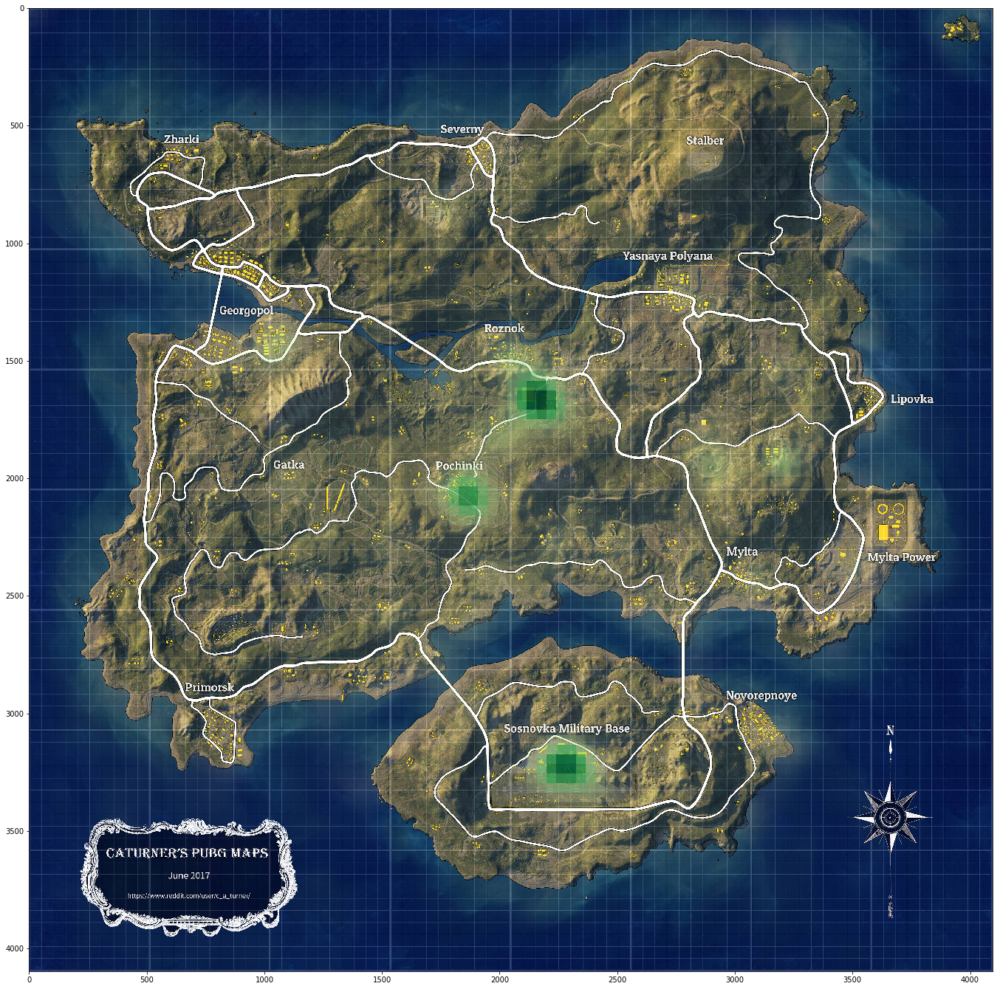

In [22]:
from scipy.ndimage.filters import gaussian_filter
import matplotlib.cm as cm
from matplotlib.colors import Normalize


def heatmap(x, y, s, bins=100):
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=s)

    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    return heatmap.T, extent

bg = imread('erangel.jpg')
hmap, extent = heatmap(plot_kills_er[:,0], plot_kills_er[:,1], 1.5)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*1.5, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.YlGn(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.YlGn, alpha=0.9)
#plt.scatter(plot_data_er[:,0], plot_data_er[:,1])
plt.gca().invert_yaxis()
plt.show()

In [17]:
plot_victim_er = np.vstack([death_by_players[['victim_position_x', 'victim_position_y']].values])

In [19]:
plot_victim_er = plot_victim_er*4096/800000

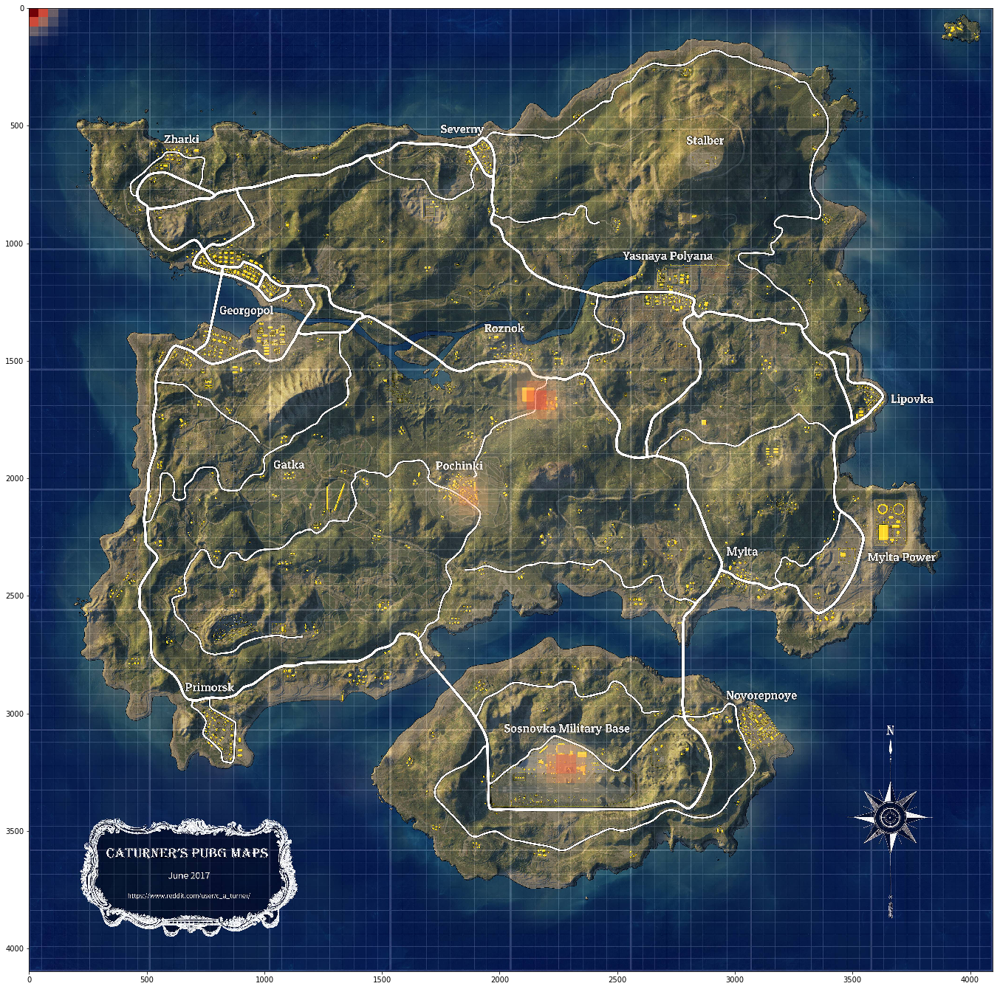

In [20]:
bg = imread('erangel.jpg')
hmap, extent = heatmap(plot_victim_er[:,0], plot_victim_er[:,1], 1.5)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*1.5, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.OrRd(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.OrRd, alpha=0.9)
#plt.scatter(plot_data_er[:,0], plot_data_er[:,1])
plt.gca().invert_yaxis()
plt.show()

In [26]:
df_second_er = deaths[(deaths['victim_placement'] == 2)].dropna()

In [29]:
plot_final_er = np.vstack([df_second_er[['victim_position_x', 'victim_position_y']].values, 
                          df_second_er[['killer_position_x', 'killer_position_y']].values])

In [30]:
plot_final_er = plot_final_er*4096/800000

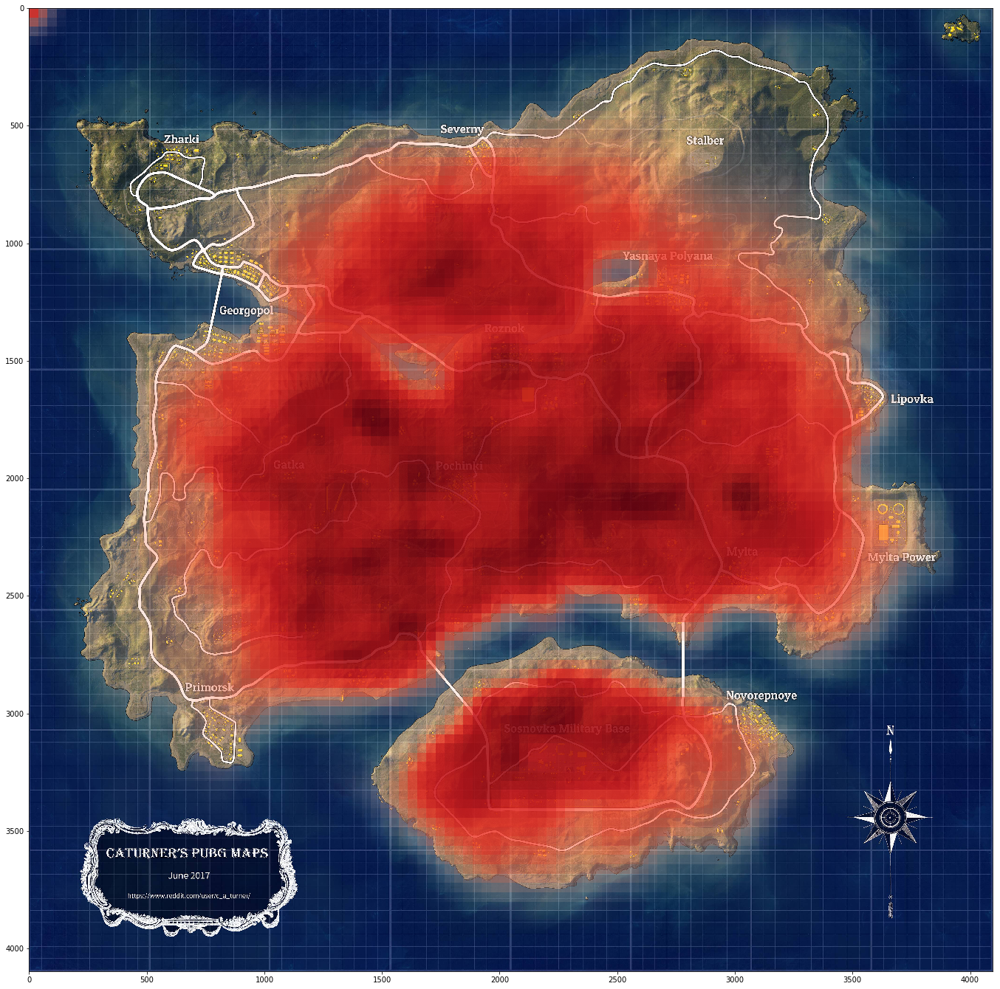

In [31]:
bg = imread('erangel.jpg')
hmap, extent = heatmap(plot_final_er[:,0], plot_final_er[:,1], 1.5)
alphas = np.clip(Normalize(0, hmap.max(), clip=True)(hmap)*1.5, 0.0, 1.)
colors = Normalize(0, hmap.max(), clip=True)(hmap)
colors = cm.Reds(colors)
colors[..., -1] = alphas

fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bg)
ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=0.9)
#plt.scatter(plot_data_er[:,0], plot_data_er[:,1])
plt.gca().invert_yaxis()
plt.show()